# Challenge for "Merit Prize" 25/26

Group 09 - Daniel Martins Borges (109474) and Duarte Pereira da Cruz (110181)

Warning: this notebook only contains the analysis done on the dataset with punctuation and no stop words. To check the analysis of the other datasets, please check the ```/notebooks``` folder on the main repository or click [here](../../notebooks/). For dataset comparison, please check click [here](../../notebooks/report_stuff/dataset_comparison.ipynb) 

In [ ]:
# === Standard Library ===
import os
import re
import json
from datetime import datetime
import unicodedata

# === Data Handling ===
import pandas as pd
import numpy as np
import joblib

# === Visualisation ===
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML
from wordcloud import WordCloud

# === NLP / Text Processing ===
import nltk
from nltk.corpus import stopwords
from lime.lime_text import LimeTextExplainer

# === ML: Feature Extraction ===
from sklearn.feature_extraction.text import TfidfVectorizer

# === ML: Models ===
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

# === ML: Evaluation ===
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.inspection import permutation_importance

# === ML: Unsupervised ===
from sklearn.cluster import KMeans
from sklearn.decomposition import TruncatedSVD

# === Ensure NLTK stopwords are available ===
try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')

[nltk_data] Error loading stopwords: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1020)>


## Exercise 1 - Model Training and Evaluation

### a) Extracting TF-IDF features

Requirements:
- maximum numbers of terms set to 5000
- add idf smoothing for out-of-vocabulary words
- minimum number of documents a term must appear in as min_df=10
- maximum proportion of documents a term can appear in as max_df=0.9

In [3]:
# loading the dataset

# paths
train_csv = "./data/train.csv"
val_csv   = "./data/val.csv"
test_csv  = "./data/test.csv"

# load; all of them have 2 columns: Text, Label
train = pd.read_csv(train_csv)
val   = pd.read_csv(val_csv)
test  = pd.read_csv(test_csv)

print("Train:", train.shape, "Val:", val.shape, "Test:", test.shape)

Train: (50587, 2) Val: (6324, 2) Test: (6324, 2)


In [4]:
# cleaning the dataset - lowercases and removes extra whitespaces in every text
def clean_data(text):
    #check for actual missing values
    if pd.isna(text) or text is None:
        return None
        
    #convert to string and strip whitespace
    text_str = str(text).lower().strip()
    
    #check for literal string "None", "nan", or empty
    if text_str in ['none', 'nan', 'null', '']:
        return None
    
    return text_str

train['text_clean'] = train['Text'].apply(clean_data)
train = train.dropna(subset=['text_clean']).reset_index(drop=True)
val['text_clean']   = val['Text'].apply(clean_data)
val = val.dropna(subset=['text_clean']).reset_index(drop=True)
test['text_clean']  = test['Text'].apply(clean_data)
test = test.dropna(subset=['text_clean']).reset_index(drop=True)

In [ ]:
def strip_accents_unicode(s):
    return unicodedata.normalize('NFKD', s).encode('ascii', 'ignore').decode('utf-8')

pt_stopwords = [strip_accents_unicode(w.lower()) for w in stopwords.words('portuguese')]


# TF-IDF vectorizer with requested params
tfidf = TfidfVectorizer(
    max_features=5000,
    min_df=10,
    max_df=0.9,
    smooth_idf=True,   # idf smoothing
    strip_accents='unicode', # for characters like ç, ã, etc
    stop_words=pt_stopwords
)

joblib.dump(tfidf, "./artifacts/tfidf_vectorizer.joblib") #saving vectorization

LookupError: 
**********************************************************************
  Resource [93mstopwords[0m not found.
  Please use the NLTK Downloader to obtain the resource:

  [31m>>> import nltk
  >>> nltk.download('stopwords')
  [0m
  For more information see: https://www.nltk.org/data.html

  Attempted to load [93mcorpora/stopwords[0m

  Searched in:
    - '/Users/duartecruz/nltk_data'
    - '/Library/Frameworks/Python.framework/Versions/3.13/nltk_data'
    - '/Library/Frameworks/Python.framework/Versions/3.13/share/nltk_data'
    - '/Library/Frameworks/Python.framework/Versions/3.13/lib/nltk_data'
    - '/usr/share/nltk_data'
    - '/usr/local/share/nltk_data'
    - '/usr/lib/nltk_data'
    - '/usr/local/lib/nltk_data'
**********************************************************************


In [ ]:
# fit on training texts and transform all splits

X_train = tfidf.fit_transform(train['text_clean'])
X_val   = tfidf.transform(val['text_clean'])
X_test  = tfidf.transform(test['text_clean'])

y_train = train['Label'].astype(int).values
y_val   = val['Label'].astype(int).values
y_test  = test['Label'].astype(int).values

print("TF-IDF shapes:", X_train.shape, X_val.shape, X_test.shape)

TF-IDF shapes: (50554, 5000) (6321, 5000) (6320, 5000)


['../artifacts/punctuation_no_stop_words/tfidf_vectorizer.joblib']

### b) Training models

Requirements:
- use 5-fold cross-validation
- tune key hyperparameters systematically (e.g., regularization strength λ, tree depth)
- document your hyperparameter search process

Models to use:
- Decision Tree
- Gaussian Naive Bayes
- Logistic Regression with L2 regularization
- Logistic Regression with L1 regularization
- Multi-Layer Perceptron (MLP) - You are free to choose your architecture but up to 2 hidden layers.

#### Global Stuff

In [ ]:
# dir to save all models
os.makedirs("../artifacts/models", exist_ok=True)

# cross validation 
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

def run_grid_search(model, param_grid, X, y, model_name, n_jobs):
    print(f"Running GridSearchCV for {model_name}...")
    
    grid = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='f1_macro',
        cv=cv,
        n_jobs=n_jobs,
        verbose=1,
        return_train_score=True
    )
    grid.fit(X, y)

    # results file paths
    results_path = f"./artifacts/models/{model_name}_cv_results.csv"
    best_model_path = f"./artifacts/models/{model_name}_best.joblib"
    metadata_path = f"./artifacts/models/{model_name}_metadata.json"

    # save CV results
    new_results_df = pd.DataFrame(grid.cv_results_)
    new_results_df['run_timestamp'] = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    
    if os.path.exists(results_path):
        # not the first run, so append this run
        old_results_df = pd.read_csv(results_path)
        combined_df = pd.concat([old_results_df, new_results_df], ignore_index=True)
        combined_df.to_csv(results_path, index=False)
    else:
        #first run
        new_results_df.to_csv(results_path, index=False)

    # save best model only if it's better than the existing one
    current_best_score = grid.best_score_
    save_model = True

    if os.path.exists(metadata_path) and os.path.exists(best_model_path):
        try:
            with open(metadata_path, 'r') as f:
                metadata = json.load(f)
                previous_best_score = metadata.get('best_cv_score', -1)

            print(f"Comparing New CV Score ({current_best_score:.4f}) vs Old CV Score ({previous_best_score:.4f})")
            
            if previous_best_score >= current_best_score:
                save_model = False
                print(f"Existing model for {model_name} is better (or equal). Not overwriting.")
                
        except Exception as e:
            print(f"Warning: Could not read metadata. Overwriting model. Error: {e}")
            save_model = True

    if save_model:
        # Save new best model
        joblib.dump(grid.best_estimator_, best_model_path)
        metadata = {
            'best_cv_score': current_best_score,
            'best_params': grid.best_params_,
            'timestamp': datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        }
        with open(metadata_path, 'w') as f:
            json.dump(metadata, f, indent=4)
        print(f"Saved new best model for {model_name}.")

    best_model = joblib.load(best_model_path)
    print(f"Best params for {model_name}: {metadata.get('best_params', grid.best_params_)}")
    print(f"Best CV F1-macro: {metadata.get('best_cv_score', current_best_score):.4f}")

    return best_model


#### Decision Tree

In [ ]:
#takes 6 mins to run
dt_params = {
    'max_depth': [10, 20, 50, None],
    'min_samples_split': [2, 5, 10]
}

best_dt = run_grid_search(
    DecisionTreeClassifier(random_state=42),
    dt_params,
    X_train,
    y_train,
    "decision_tree",
    -1
)


Running GridSearchCV for decision_tree...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Saved new best model for decision_tree.
Best params for decision_tree: {'max_depth': 50, 'min_samples_split': 2}
Best CV F1-macro: 0.8433


#### Gaussian Naive Bayes

In [ ]:
#takes 2 mins to run
X_train_dense = X_train.toarray() # since GaussianNB requires dense input and TF-IDF is sparse, we convert using .toarray()

gnb_params = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]
}

best_gnb = run_grid_search(
    GaussianNB(),
    gnb_params,
    X_train_dense,
    y_train,
    "gaussian_nb",
    2
)


Running GridSearchCV for gaussian_nb...
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Saved new best model for gaussian_nb.
Best params for gaussian_nb: {'var_smoothing': 1e-06}
Best CV F1-macro: 0.8499


#### Logistic Regression

In [ ]:
#takes 1 min to run
# with L2 regularization 
lr_l2_params = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'saga'],
    'penalty': ['l2']
}

best_lr_l2 = run_grid_search(
    LogisticRegression(max_iter=5000, n_jobs=-1),
    lr_l2_params,
    X_train,
    y_train,
    "logreg_l2",
    -1
)

Running GridSearchCV for logreg_l2...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Saved new best model for logreg_l2.
Best params for logreg_l2: {'C': 10, 'penalty': 'l2', 'solver': 'saga'}
Best CV F1-macro: 0.9001


In [ ]:
#takes 19 mins to run
# with L1 regularization
lr_l1_params = {
    'C': [0.01, 0.1, 1, 10],
    'solver': ['liblinear', 'saga'],
    'penalty': ['l1']
}

best_lr_l1 = run_grid_search(
    LogisticRegression(max_iter=5000, n_jobs=-1),
    lr_l1_params,
    X_train,
    y_train,
    "logreg_l1",
    -1
)

Running GridSearchCV for logreg_l1...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Saved new best model for logreg_l1.
Best params for logreg_l1: {'C': 1, 'penalty': 'l1', 'solver': 'saga'}
Best CV F1-macro: 0.8973


#### Multi-Layer Perceptron

In [ ]:
#takes 6 hours to run
mlp_params = {
    'hidden_layer_sizes': [(128,), (256,), (128, 64), (256, 128)],
    'alpha': [1e-4, 1e-3, 1e-2],
    'learning_rate_init': [1e-3, 1e-4]
}

best_mlp = run_grid_search(
    MLPClassifier(max_iter=50, random_state=42),  # early stopping happens automatically
    mlp_params,
    X_train,
    y_train,
    "mlp",
    -1
)

Running GridSearchCV for mlp...
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Saved new best model for mlp.
Best params for mlp: {'alpha': 0.01, 'hidden_layer_sizes': (256, 128), 'learning_rate_init': 0.001}
Best CV F1-macro: 0.9177


#### Evaluation

In [ ]:
#importing the best models -> RUN THIS CELL SO THAT YOU DON'T NEED TO TRAIN THE MODELS
import numpy as np

def load_model(model_name):
    best_model_path = f"./artifacts/models/{model_name}_best.joblib"
    return joblib.load(best_model_path)

best_dt = load_model("decision_tree")
best_gnb = load_model("gaussian_nb")
best_lr_l2 = load_model("logreg_l2")
best_lr_l1 = load_model("logreg_l1")
best_mlp = load_model("mlp")

In [12]:
from sklearn.metrics import classification_report, f1_score

def evaluate_model(model, X, y, name):
    y_pred = model.predict(X)
    f1 = f1_score(y, y_pred, average='macro')
    print(f"\n{name} – Validation F1-macro: {f1:.4f}")
    print(classification_report(y, y_pred))
    return f1

X_val_dense = X_val.toarray() # same as before; since GaussianNB requires dense input and TF-IDF is sparse, we convert using .toarray()

val_results = {
    "DecisionTree": evaluate_model(best_dt, X_val, y_val, "Decision Tree"),
    "GaussianNB": evaluate_model(best_gnb, X_val_dense, y_val, "GaussianNB"),
    "LR_L2": evaluate_model(best_lr_l2, X_val, y_val, "LR L2"),
    "LR_L1": evaluate_model(best_lr_l1, X_val, y_val, "LR L1"),
    "MLP": evaluate_model(best_mlp, X_val, y_val, "MLP")
}

print("\nValidation F1 results summary:")
print(val_results)



Decision Tree – Validation F1-macro: 0.8499
              precision    recall  f1-score   support

           0       0.83      0.88      0.85      3141
           1       0.87      0.82      0.85      3180

    accuracy                           0.85      6321
   macro avg       0.85      0.85      0.85      6321
weighted avg       0.85      0.85      0.85      6321


GaussianNB – Validation F1-macro: 0.8530
              precision    recall  f1-score   support

           0       0.86      0.85      0.85      3141
           1       0.85      0.86      0.85      3180

    accuracy                           0.85      6321
   macro avg       0.85      0.85      0.85      6321
weighted avg       0.85      0.85      0.85      6321


LR L2 – Validation F1-macro: 0.9065
              precision    recall  f1-score   support

           0       0.90      0.91      0.91      3141
           1       0.91      0.90      0.91      3180

    accuracy                           0.91      6321
   m

### c) Comparison table

#### Based on test metrics

In [ ]:
def evaluate_test(model, X, y):
    """Compute test metrics for the comparison table."""
    y_pred = model.predict(X)
    return {
        "accuracy": accuracy_score(y, y_pred),
        "precision_macro": precision_score(y, y_pred, average="macro"),
        "recall_macro": recall_score(y, y_pred, average="macro"),
        "f1_macro": f1_score(y, y_pred, average="macro")
    }

X_test_dense = X_test.toarray() # dense version for GNB

# evaluate all models on test set
test_results = {
    "DecisionTree": evaluate_test(best_dt, X_test, y_test),
    "GaussianNB": evaluate_test(best_gnb, X_test_dense, y_test),
    "LR_L2": evaluate_test(best_lr_l2, X_test, y_test),
    "LR_L1": evaluate_test(best_lr_l1, X_test, y_test),
    "MLP": evaluate_test(best_mlp, X_test, y_test)
}

# build comparison table
df_test = pd.DataFrame(test_results).T
print("\n=== Test Set Comparison Table ===")
display(df_test)

# Save results to CSV for later aggregation
output_path = "./artifacts/test_results.csv"
df_test.to_csv(output_path)
print(f"Test results saved to {output_path}")


=== Test Set Comparison Table ===


,accuracy,precision_macro,recall_macro,f1_macro
DecisionTree,0.858861,0.859239,0.858815,0.858812
GaussianNB,0.851582,0.851681,0.851606,0.851577
LR_L2,0.900000,0.900029,0.899988,0.899996
LR_L1,0.900949,0.900952,0.900946,0.900948
MLP,0.926108,0.926152,0.926094,0.926104


Test results saved to ../artifacts/punctuation_no_stop_words/test_results.csv


In [14]:
# select best model (based on F1-macro)
best_model_name = df_test["f1_macro"].idxmax()
print("\nBest model based on Test F1-macro:", best_model_name)

# retrieve actual model
best_model = {
    "DecisionTree": best_dt,
    "GaussianNB": best_gnb,
    "LR_L2": best_lr_l2,
    "LR_L1": best_lr_l1,
    "MLP": best_mlp
}[best_model_name]

best_X_test = X_test_dense if best_model_name == "GaussianNB" else X_test


Best model based on Test F1-macro: MLP


#### ROC Curve + Macro-Averaged AUC

Unique labels: [0 1]
Number of classes: 2
y_score shape: (6320,)


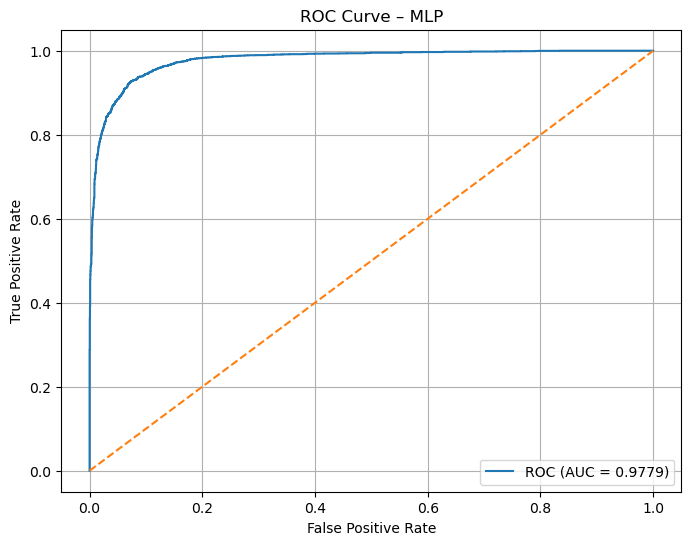


AUC: 0.9779160201888355


In [ ]:
# identify unique classes
classes = np.unique(y_test)

print("Unique labels:", classes)
print("Number of classes:", len(classes))

# probability scores (P(y=1))
if hasattr(best_model, "predict_proba"):
    y_score = best_model.predict_proba(best_X_test)[:, 1] # positive class only
else:
    y_score = best_model.decision_function(best_X_test)
    # if decision_function returns shape (N,), no slicing needed

print("y_score shape:", y_score.shape)

# compute ROC curve for the positive class
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=1)

# compute AUC
roc_auc = auc(fpr, tpr)

# plot ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], linestyle='--')
plt.title(f"ROC Curve – {best_model_name}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()

print("\nAUC:", roc_auc)


## Exercise 2 - Model Training and Evaluation

In [ ]:
#load previously saved artifacts
tfidf = joblib.load("../artifacts/tfidf_vectorizer.joblib")
best_lr_l2 = joblib.load("../artifacts/models/logreg_l2_best.joblib")
best_lr_l1 = joblib.load("../artifacts/models/logreg_l1_best.joblib")
best_mlp   = joblib.load("../artifacts/models/mlp_best.joblib")

#load data (same splits used earlier)
train_csv = "../data/train.csv"
val_csv   = "../data/val.csv"
test_csv  = "../data/test.csv"

val = pd.read_csv(val_csv)
train = pd.read_csv(train_csv)
test = pd.read_csv(test_csv)

# preprocess (same method applied earlier)
# cleaning the dataset - lowercases and removes extra whitespaces in every text
def clean_data(text):
    #check for actual missing values
    if pd.isna(text) or text is None:
        return None
        
    #convert to string and strip whitespace
    text_str = str(text).lower().strip()
    
    #check for literal string "None", "nan", or empty
    if text_str in ['none', 'nan', 'null', '']:
        return None
    
    return text_str

val['text_clean'] = val['Text'].apply(clean_data)
val = val.dropna(subset=['text_clean']).reset_index(drop=True)

X_val = tfidf.transform(val['text_clean'])
y_val = val['Label'].values
feature_names = tfidf.get_feature_names_out()

#target class names
class_names = ["Real", "Fake"]

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfTransformer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfVectorizer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Tr

### a) For your best Logistic Regression model, extract and visualize the weights in a bar plot:
#### • Top 10 words most indicative of fake news
#### • Top 10 words most indicative of real news

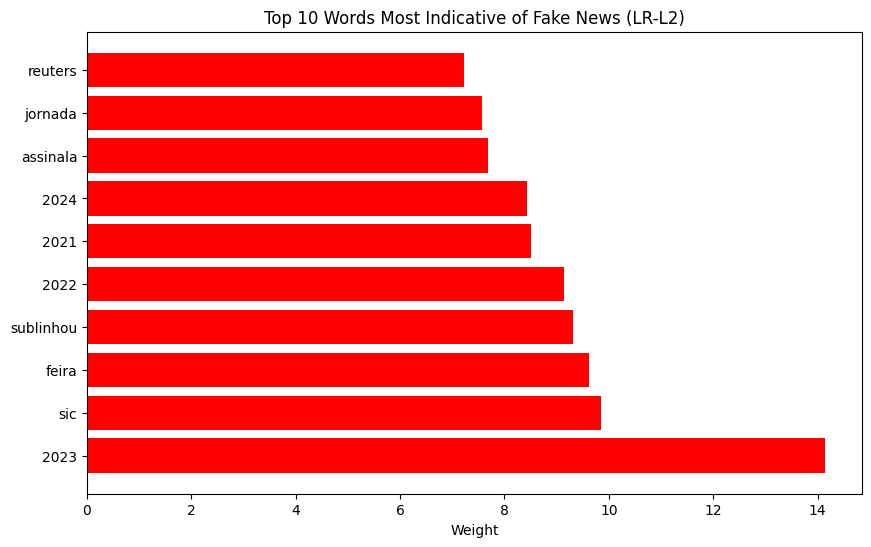

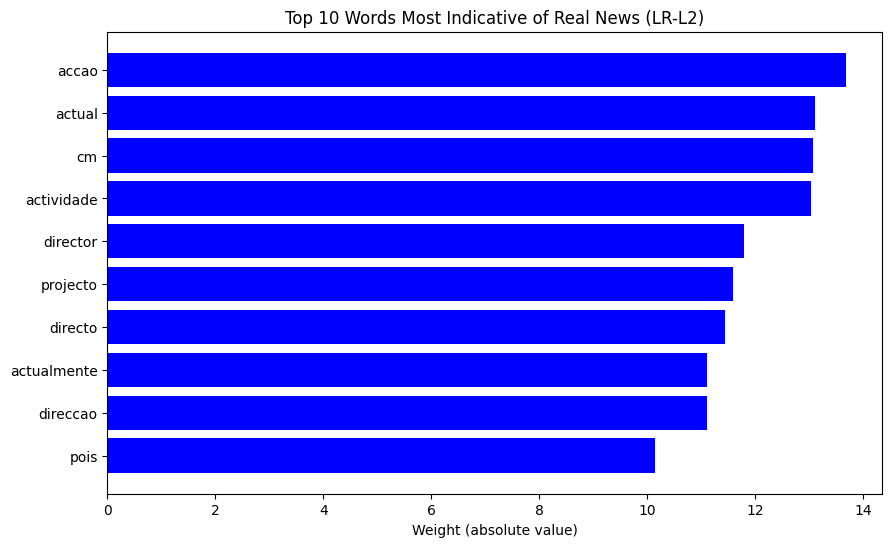

In [ ]:
weights = best_lr_l2.coef_[0] #the best lr model was the l2

#top 10 fake news
top_fake_idx = np.argsort(weights)[-10:]
top_fake_words = feature_names[top_fake_idx]
top_fake_vals = weights[top_fake_idx]

#top 10 real news
top_real_idx = np.argsort(weights)[:10]
top_real_words = feature_names[top_real_idx]
top_real_vals = weights[top_real_idx]

#plot (Fake)
plt.figure(figsize=(10,6))
plt.barh(top_fake_words, top_fake_vals, color="red")
plt.title("Top 10 Words Most Indicative of Fake News (LR-L2)")
plt.xlabel("Weight")
plt.gca().invert_yaxis()
plt.show()

#plot (Real)
plt.figure(figsize=(10,6))
plt.barh(top_real_words, -top_real_vals, color="blue")
plt.title("Top 10 Words Most Indicative of Real News (LR-L2)")
plt.xlabel("Weight (absolute value)")
plt.gca().invert_yaxis()
plt.show()

### b) Compare L1 vs L2 regularized models: How many features have non-zero weights in each? What does this tell you about feature selection? When would you prefer L1 vs L2 regularization for text classification?

In [ ]:
nz_l2 = np.count_nonzero(best_lr_l2.coef_)
nz_l1 = np.count_nonzero(best_lr_l1.coef_)
total = len(feature_names)

print("Total features:", total)
print("Non-zero (L1):", nz_l1)
print("Non-zero (L2):", nz_l2)
print("L1 removed:", total - nz_l1)
print("L2 removed:", total - nz_l2)

Total features: 5000
Non-zero (L1): 2102
Non-zero (L2): 5000
L1 removed: 2898
L2 removed: 0


### c) For your best Logistic Regression model, select samples in the validation set with ID 2921, 2437, 5557, 1697, and extract explanations with LIME (Ribeiro et al., 2016; Lundberg and Lee, 2017). For a practical reference, check [this](https://marcotcr.github.io/lime/tutorials/Lime%20-%20basic%20usage%2C%20two%20class%20case.html)

In [ ]:
def predict_proba_text(text_list):
    X = tfidf.transform(text_list)
    return best_lr_l2.predict_proba(X)

explainer = LimeTextExplainer(class_names=class_names)

sample_ids = [2921, 2437, 5557, 1697]

for id in sample_ids:
    text = val.loc[id, 'text_clean'] #get text

    exp = explainer.explain_instance(
        text,
        predict_proba_text,
        num_features=10
    )

    print("\nSample ID:", id)
    display(exp.as_list())
    display(HTML(exp.as_html(text=text)))




Sample ID: 2921


[(np.str_('2023'), 0.03192486716783506),
 (np.str_('2024'), 0.025338348812970812),
 (np.str_('sul'), 0.01872484499742357),
 (np.str_('temperaturas'), -0.018255988425226882),
 (np.str_('chegada'), 0.016816263880904212),
 (np.str_('sublinha'), 0.013863977332186993),
 (np.str_('anunciou'), 0.013165463763665704),
 (np.str_('indicou'), 0.012331248300405877),
 (np.str_('divulgado'), 0.01204570093243274),
 (np.str_('boletim'), -0.0037689180167903786)]


Sample ID: 2437


[(np.str_('director'), -0.06287418900638578),
 (np.str_('alemão'), -0.021600633037652875),
 (np.str_('terra'), -0.019485831891581724),
 (np.str_('anos'), 0.019188777516336263),
 (np.str_('coronavírus'), -0.01473746464604109),
 (np.str_('mandado'), -0.012737984505931837),
 (np.str_('amarela'), 0.011918112778624779),
 (np.str_('agora'), 0.005881385132415949),
 (np.str_('empresa'), -0.005809607648194331),
 (np.str_('contra'), 0.004744332247824489)]


Sample ID: 5557


[(np.str_('temporada'), 0.06820348250459642),
 (np.str_('liga'), 0.06751685215090439),
 (np.str_('completamente'), -0.05983858475001901),
 (np.str_('época'), 0.05436563343838011),
 (np.str_('equipa'), 0.048267531929645544),
 (np.str_('domingo'), 0.04771567539296274),
 (np.str_('jornada'), 0.04643230827410808),
 (np.str_('campeão'), 0.04560694375913983),
 (np.str_('grande'), -0.024781277209813816),
 (np.str_('imprensa'), -0.01253009739672911)]


Sample ID: 1697


[(np.str_('dívida'), -0.09059759919186033),
 (np.str_('banco'), 0.03815266853536982),
 (np.str_('milhões'), 0.03673433168150212),
 (np.str_('internacional'), 0.03520863903595426),
 (np.str_('euros'), -0.03376461000729892),
 (np.str_('embora'), -0.03298822034223986),
 (np.str_('essencialmente'), -0.031745130156790397),
 (np.str_('garantir'), 0.030495410185716578),
 (np.str_('todos'), -0.025072422443894363),
 (np.str_('recentemente'), -0.024354923739520726)]

### d) For your MLP, select samples in the validation set with ID 2921, 2437, 5557, 1697, and extract explanations with LIME and permutation importance. For permutation importance, select 1K random samples. Visualize the results and discuss their differences.

#### Lime Analysis

In [ ]:
def predict_proba_text_mlp(text_list):
    X = tfidf.transform(text_list)
    return best_mlp.predict_proba(X)

explainer = LimeTextExplainer(class_names=["Real", "Fake"])

sample_ids = [2921, 2437, 5557, 1697] #ids

lime_explanations_mlp = {}

for id in sample_ids:
    text = val.loc[id, 'text_clean']

    exp = explainer.explain_instance(
        text,
        predict_proba_text_mlp,
        num_features=10
    )

    lime_explanations_mlp[id] = exp
    
    print(f"\nSample ID: {id}")
    display(exp.as_list())
    display(HTML(exp.as_html(text=text)))



Sample ID: 2921


[(np.str_('2024'), 0.01309343888073571),
 (np.str_('2023'), 0.012636249721967042),
 (np.str_('aumento'), 0.011902775412713755),
 (np.str_('sul'), 0.011782959303766646),
 (np.str_('el'), 0.011577180113336773),
 (np.str_('agência'), 0.010397933000798958),
 (np.str_('temperaturas'), -0.009123404583507654),
 (np.str_('geralmente'), -0.0008247844783602488),
 (np.str_('mundo'), 0.0005700937545106762),
 (np.str_('intensidade'), -2.9749364697440703e-05)]


Sample ID: 2437


[(np.str_('director'), -0.00996492818198131),
 (np.str_('alemão'), -0.007005006747599431),
 (np.str_('anos'), 0.005446510527855798),
 (np.str_('chegou'), 0.004448497322316397),
 (np.str_('vacina'), -0.0037870390038137964),
 (np.str_('médico'), -0.003670120581607973),
 (np.str_('coronavírus'), -0.003234929437574163),
 (np.str_('amarela'), -0.003007038180082606),
 (np.str_('empresa'), 0.0022461787694669066),
 (np.str_('agora'), 0.0016124602622809567)]


Sample ID: 5557


[(np.str_('temporada'), 0.03639434731864396),
 (np.str_('liga'), 0.03553609495576429),
 (np.str_('anos'), 0.034697956258932905),
 (np.str_('equipa'), 0.031168417981191764),
 (np.str_('domingo'), 0.029976338542640157),
 (np.str_('treinador'), 0.028947602455469686),
 (np.str_('fazer'), 0.02815416752433337),
 (np.str_('completamente'), -0.017072566607748103),
 (np.str_('bom'), -0.014120928219993513),
 (np.str_('grande'), -0.012549020528903549)]


Sample ID: 1697


[(np.str_('dívida'), -0.04114099327601924),
 (np.str_('euros'), -0.034021151337103823),
 (np.str_('mil'), 0.030503399821934524),
 (np.str_('portugal'), -0.030284477875899267),
 (np.str_('garantir'), 0.01921974497974488),
 (np.str_('embora'), -0.017884666964582196),
 (np.str_('recentemente'), -0.016818019253736313),
 (np.str_('voltou'), -0.01630978025695412),
 (np.str_('todos'), -0.01224508659072769),
 (np.str_('agosto'), -0.012032826032423538)]

#### Permutation Importance (1000 samples)

Running permutation importance...


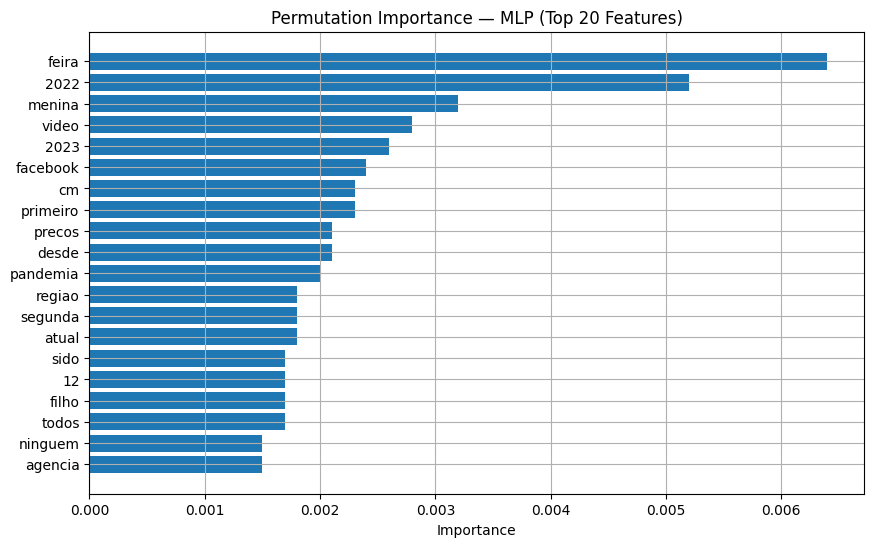

In [ ]:
#takes 12 mins to run
#sample 1000 random validation items
sample_idx = np.random.choice(X_val.shape[0], 1000, replace=False)
X_val_sample = X_val[sample_idx].toarray()
y_val_sample = y_val[sample_idx]

print("Running permutation importance...")

result = permutation_importance(
    best_mlp, X_val_sample, y_val_sample,
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

# Top 20 most important features
sorted_idx = result.importances_mean.argsort()[::-1][:20]
top_features = feature_names[sorted_idx]
top_scores = result.importances_mean[sorted_idx]

plt.figure(figsize=(10, 6))
plt.barh(top_features, top_scores)
plt.gca().invert_yaxis()
plt.title("Permutation Importance — MLP (Top 20 Features)")
plt.xlabel("Importance")
plt.grid(True)
plt.show()


## Exercise 3 - Clustering

In [ ]:
import re

#load previously saved artifacts
tfidf = joblib.load("./artifacts/tfidf_vectorizer.joblib")

#load data (same splits used earlier)
train_csv = "./data/train.csv"

train = pd.read_csv(train_csv)

# preprocess (same method applied earlier)
# cleaning the dataset - lowercases and removes extra whitespaces in every text
def clean_data(text):
    #check for actual missing values
    if pd.isna(text) or text is None:
        return None
        
    #convert to string and strip whitespace
    text_str = str(text).lower().strip()
    
    #check for literal string "None", "nan", or empty
    if text_str in ['none', 'nan', 'null', '']:
        return None
    
    return text_str

train['text_clean'] = train['Text'].apply(clean_data)
train = train.dropna(subset=['text_clean']).reset_index(drop=True)

X_train = tfidf.transform(train['text_clean'])

# Calculate the number of non-zero elements for each row
non_zero_counts = X_train.getnnz(axis=1)

# Identify rows that have at least one valid word
valid_indices = non_zero_counts > 0

# Filter both the Matrix and the DataFrame
X_train = X_train[valid_indices]
train = train[valid_indices].reset_index(drop=True)

print(f"Rows dropped due to empty vectors: {len(valid_indices) - sum(valid_indices)}")
print(f"Final Shape for Clustering: {X_train.shape}")

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfTransformer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfVectorizer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Rows dropped due to empty vectors: 9
Final Shape for Clustering: (50545, 5000)


### a) Apply K-Means with K=5 on your training set.

In [ ]:
# Initialize K-Means
kmeans = KMeans(
    n_clusters=5,
    init='k-means++',
    n_init=10,
    random_state=42,
    algorithm = "lloyd",
)

# Fit the model on the training set
print("Fitting K-Means with K=5 on X_train...")
kmeans.fit(X_train)

# Get the cluster assignments
train_cluster_labels = kmeans.labels_

print("K-Means training complete.")
print(f"Cluster labels shape: {train_cluster_labels.shape}")

# Save the model for use in 3b and 3c
joblib.dump(kmeans, "../artifacts/models/kmeans_model.joblib")

Fitting K-Means with K=5 on X_train...
K-Means training complete.
Cluster labels shape: (50545,)


['../artifacts/punctuation_no_stop_words/models/kmeans_model.joblib']

### b) Inspect 3 documents closest to each centroid, and afterwards, assign semantic labels to each cluster (e.g., “political fake news”, “health misinformation”).

In [ ]:
dist_matrix = kmeans.transform(X_train)

# Iterate through each cluster to find nearest docs and top terms
print("--- Cluster Inspection ---")

feature_names = np.array(tfidf.get_feature_names_out())

for cluster_id in range(5):
    print(f"\n### CLUSTER {cluster_id} ###")
    
    # A. Print Top Keywords (Crucial for labeling!)
    # We find the center of the cluster and get the indices of the highest values
    centroid = kmeans.cluster_centers_[cluster_id]
    # Sort indices by value descending
    top_term_indices = centroid.argsort()[::-1][:10] 
    top_terms = feature_names[top_term_indices]
    print(f"Key Terms: {', '.join(top_terms)}")
    
    print("-" * 40)
    
    # B. Print Closest Documents
    closest_doc_indices = dist_matrix[:, cluster_id].argsort()[:3]

    for idx in closest_doc_indices:
        original_text = train.iloc[idx]['Text']
        label = train.iloc[idx]['Label']
        
        # Print a snippet (first 300 chars) to keep output readable
        print(f"  - [Row {idx}] (Label: {label}): {original_text[:300]}...")

--- Cluster Inspection ---

### CLUSTER 0 ###
Key Terms: governo, ministro, costa, presidente, sobre, estado, primeiro, ps, antonio, portugal
----------------------------------------
  - [Row 31135] (Label: 1): Ana Gomes: "Este governo também está a fabricar populismos"
Militante de base, como gosta de sublinhar ser, Ana Gomes é uma das vozes independentes do PS e não vê com bons olhos um braço de ferro com Marcelo. Não cala críticas à forma como António Costa tem respondido à crise e lembra que o Presiden...
  - [Row 39849] (Label: 1): Maioria dos conselheiros defende remodelação
O Presidente Marcelo anunciou a convocação do Conselho de Estado para final de julho, altura em que também chamará a Belém os partidos. A maioria dos conselheiros de Estado já se pronunciou sobre a atual situação política e a posição dominante é que dever...
  - [Row 1159] (Label: 1): Cavaco Silva. Um ano de reptos, conselhos e críticas ao Governo de Costa
No último ano, o antigo primeiro-ministro e President

### c) Visualize clusters in 2D using PCA. Create two plots: one colored by cluster assignment, one by true label.

Starting dimensionality reduction...
Reduction complete. New shape: (50545, 2)


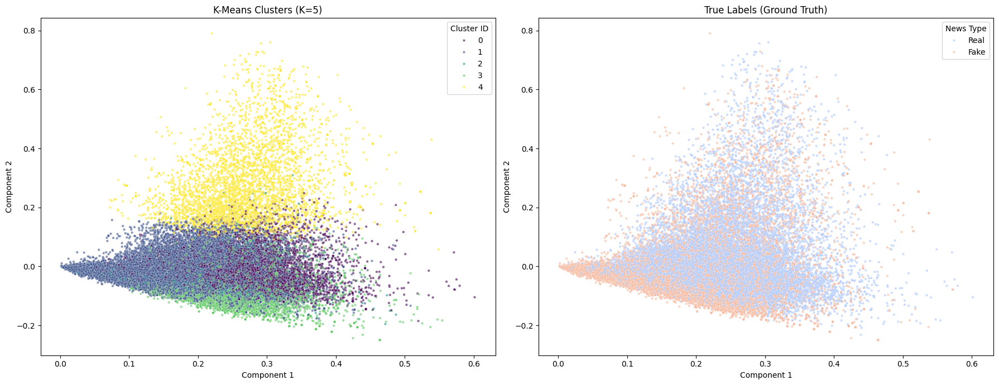

In [ ]:
# --- 3c) Visualize clusters in 2D using PCA ---
print("Starting dimensionality reduction...")

# 1. Reduce dimensions to 2D
# Note: We use TruncatedSVD because standard PCA does not support sparse inputs 
# without converting to dense (which crashes memory on large text datasets).
pca_reducer = TruncatedSVD(n_components=2, random_state=42)
X_2d = pca_reducer.fit_transform(X_train)

print(f"Reduction complete. New shape: {X_2d.shape}")

# 2. Prepare Data for Plotting
# We create a temporary DataFrame to make plotting with Seaborn easier
plot_df = pd.DataFrame(X_2d, columns=['Component 1', 'Component 2'])
plot_df['Cluster'] = train_cluster_labels
# Map labels for better legend readability (0=Fake, 1=Real)
plot_df['True Label'] = train['Label'].map({0: 'Fake', 1: 'Real'})

# 3. Create the Side-by-Side Plots
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# --- Plot 1: Colored by Cluster Assignment ---
sns.scatterplot(
    data=plot_df, 
    x='Component 1', 
    y='Component 2', 
    hue='Cluster', 
    palette='viridis', 
    s=10,             # Marker size
    alpha=0.6,        # Transparency
    ax=axes[0]
)
axes[0].set_title('K-Means Clusters (K=5)')
axes[0].legend(title='Cluster ID')

# --- Plot 2: Colored by True Label ---
sns.scatterplot(
    data=plot_df, 
    x='Component 1', 
    y='Component 2', 
    hue='True Label', 
    palette='coolwarm', # Red for Fake (warm), Blue for Real (cool) usually
    s=10, 
    alpha=0.6,
    ax=axes[1]
)
axes[1].set_title('True Labels (Ground Truth)')
axes[1].legend(title='News Type')

plt.tight_layout()
plt.show()

## Best model metrics

### Loading the dataset

In [ ]:
# loading the dataset

# paths
train_csv = "./data/train.csv"
val_csv   = "./data/val.csv"
test_csv  = "./data/test.csv"

# load; all of them have 2 columns: Text, Label
train = pd.read_csv(train_csv)
val   = pd.read_csv(val_csv)
test  = pd.read_csv(test_csv)

print("Train:", train.shape, "Val:", val.shape, "Test:", test.shape)

# cleaning the dataset - lowercases and removes extra whitespaces in every text
def clean_data(text):
    #check for actual missing values
    if pd.isna(text) or text is None:
        return None
        
    #convert to string and strip whitespace
    text_str = str(text).lower().strip()
    
    #check for literal string "None", "nan", or empty
    if text_str in ['none', 'nan', 'null', '']:
        return None
    
    return text_str

train['text_clean'] = train['Text'].apply(clean_data)
train = train.dropna(subset=['text_clean']).reset_index(drop=True)
val['text_clean']   = val['Text'].apply(clean_data)
val = val.dropna(subset=['text_clean']).reset_index(drop=True)
test['text_clean']  = test['Text'].apply(clean_data)
test = test.dropna(subset=['text_clean']).reset_index(drop=True)

# fit on training texts and transform all splits
tfidf = joblib.load("./artifacts/tfidf_vectorizer.joblib")

X_train = tfidf.transform(train['text_clean'])
X_val   = tfidf.transform(val['text_clean'])
X_test  = tfidf.transform(test['text_clean'])
y_test  = test['Label'].astype(int).values

print("TF-IDF shapes:", X_train.shape, X_val.shape, X_test.shape)

Train: (50587, 2) Val: (6324, 2) Test: (6324, 2)


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfTransformer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfVectorizer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


TF-IDF shapes: (50554, 5000) (6321, 5000) (6320, 5000)


### Confusion matrix

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator LabelBinarizer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator MLPClassifier from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


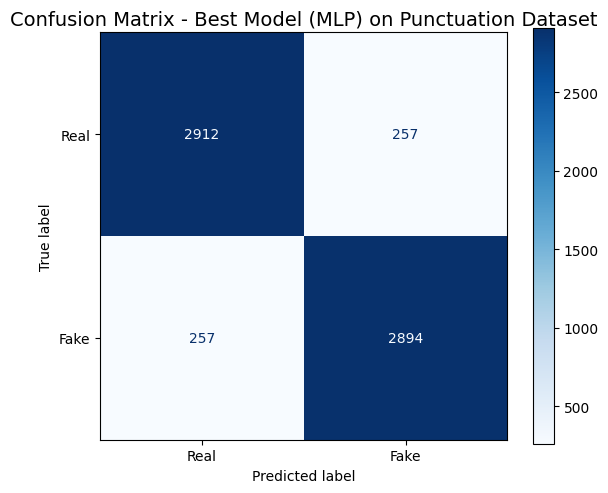

In [ ]:
# Loading the model
best_model = joblib.load("./artifacts/models/mlp_best.joblib")

# Predict on test set
y_pred = best_model.predict(X_test)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Real", "Fake"])

# Plot
plt.figure(figsize=(6,5))
disp.plot(cmap="Blues", values_format="d", ax=plt.gca())
plt.title("Confusion Matrix - Best Model (MLP) on Punctuation Dataset", fontsize=14)
plt.tight_layout()
plt.savefig("../report/assets/best_model/confusion_matrix_best_model.png")
plt.show()


### Prediction Probability Histogram
- Shows the distribution of predicted probabilities for each class.
- Useful to see how confident the model is in its predictions.

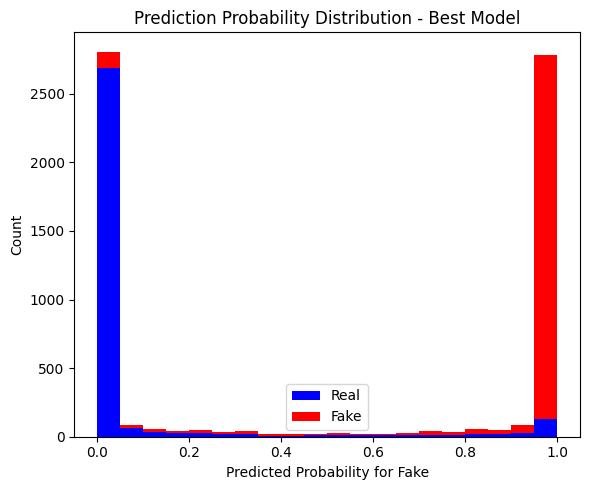

In [ ]:
probs = best_model.predict_proba(X_test)[:,1]  # probability for Fake
plt.figure(figsize=(6,5))
plt.hist([probs[y_test==0], probs[y_test==1]], bins=20, stacked=True, color=['blue','red'], label=['Real','Fake'])
plt.xlabel("Predicted Probability for Fake")
plt.ylabel("Count")
plt.title("Prediction Probability Distribution - Best Model")
plt.legend()
plt.tight_layout()
plt.savefig("../report/assets/best_model/probability_histogram_best_model.png")
plt.show()


## Misclassified Samples Inspection
- Scatter plot of predicted probability vs actual label, highlighting misclassified points.
- Highlights borderline cases.

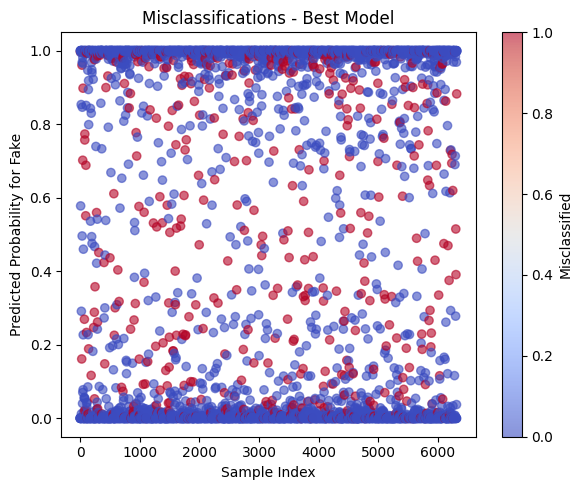

In [ ]:
y_pred = best_model.predict(X_test)
plt.figure(figsize=(6,5))
plt.scatter(range(len(y_test)), best_model.predict_proba(X_test)[:,1], c=(y_pred!=y_test), cmap='coolwarm', alpha=0.6)
plt.xlabel("Sample Index")
plt.ylabel("Predicted Probability for Fake")
plt.title("Misclassifications - Best Model")
plt.colorbar(label='Misclassified')
plt.tight_layout()
plt.savefig("../report/assets/best_model/misclassified_samples_best_model.png")
plt.show()


## Cumulative Accuracy vs Probability Threshold
- Shows how accuracy changes if you only accept predictions above a certain probability.
- Can help justify setting a threshold different from 0.5.

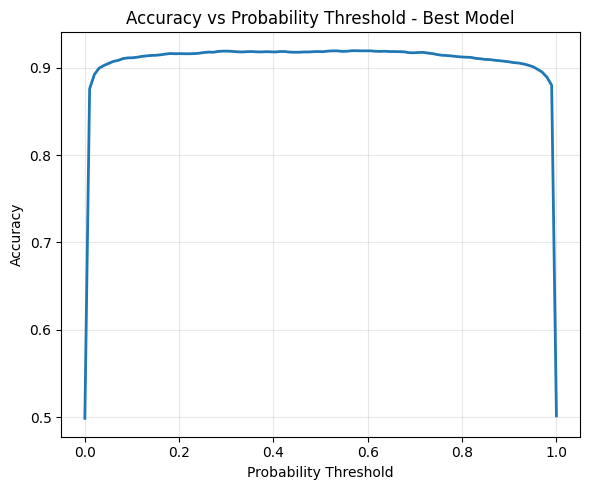

In [ ]:
thresholds = np.linspace(0,1,100)
accuracies = [np.mean((best_model.predict_proba(X_test)[:,1] > t) == y_test) for t in thresholds]

plt.figure(figsize=(6,5))
plt.plot(thresholds, accuracies, lw=2)
plt.xlabel("Probability Threshold")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Probability Threshold - Best Model")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig("s../report/assets/best_model/accuracy_vs_threshold_best_model.png")
plt.show()


## Dataset Statistics

### Loading Dataset

In [ ]:
# loading the dataset

# paths
train_csv = "./data/train.csv"
val_csv   = "./data/val.csv"
test_csv  = "./data/test.csv"

# load; all of them have 2 columns: Text, Label
train = pd.read_csv(train_csv)
val   = pd.read_csv(val_csv)
test  = pd.read_csv(test_csv)

print("Train:", train.shape, "Val:", val.shape, "Test:", test.shape)

# cleaning the dataset - lowercases and removes extra whitespaces in every text
def clean_data(text):
    #check for actual missing values
    if pd.isna(text) or text is None:
        return None
        
    #convert to string and strip whitespace
    text_str = str(text).lower().strip()
    
    #check for literal string "None", "nan", or empty
    if text_str in ['none', 'nan', 'null', '']:
        return None
    
    return text_str

train['text_clean'] = train['Text'].apply(clean_data)
train = train.dropna(subset=['text_clean']).reset_index(drop=True)
val['text_clean']   = val['Text'].apply(clean_data)
val = val.dropna(subset=['text_clean']).reset_index(drop=True)
test['text_clean']  = test['Text'].apply(clean_data)
test = test.dropna(subset=['text_clean']).reset_index(drop=True)

# fit on training texts and transform all splits
tfidf = joblib.load("./artifacts/tfidf_vectorizer.joblib")

X_train = tfidf.transform(train['text_clean'])
X_val   = tfidf.transform(val['text_clean'])
X_test  = tfidf.transform(test['text_clean'])

print("TF-IDF shapes:", X_train.shape, X_val.shape, X_test.shape)

Train: (50587, 2) Val: (6324, 2) Test: (6324, 2)


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfTransformer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfVectorizer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


TF-IDF shapes: (50554, 5000) (6321, 5000) (6320, 5000)


### Word Cloud

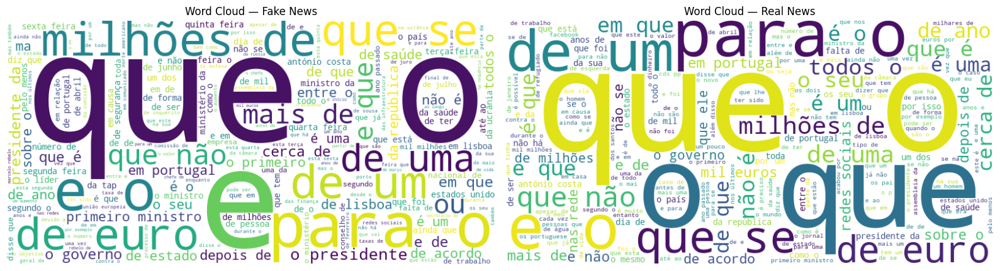

In [ ]:
# Separate Fake vs Real
fake_texts = train.loc[train['Label'] == 1, 'text_clean']
real_texts = train.loc[train['Label'] == 0, 'text_clean']

# Combine all texts per class
fake_combined = " ".join(fake_texts)
real_combined = " ".join(real_texts)

# Generate Word Clouds
wordcloud_fake = WordCloud(width=800, height=400, background_color='white').generate(fake_combined)
wordcloud_real = WordCloud(width=800, height=400, background_color='white').generate(real_combined)

# Plot
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.imshow(wordcloud_fake, interpolation='bilinear')
plt.title("Word Cloud — Fake News")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_real, interpolation='bilinear')
plt.title("Word Cloud — Real News")
plt.axis("off")

plt.tight_layout()
plt.savefig("../report/assets/visualizations/wordcloud_fake_real.png")
plt.show()


### TF-IDF Heatmap

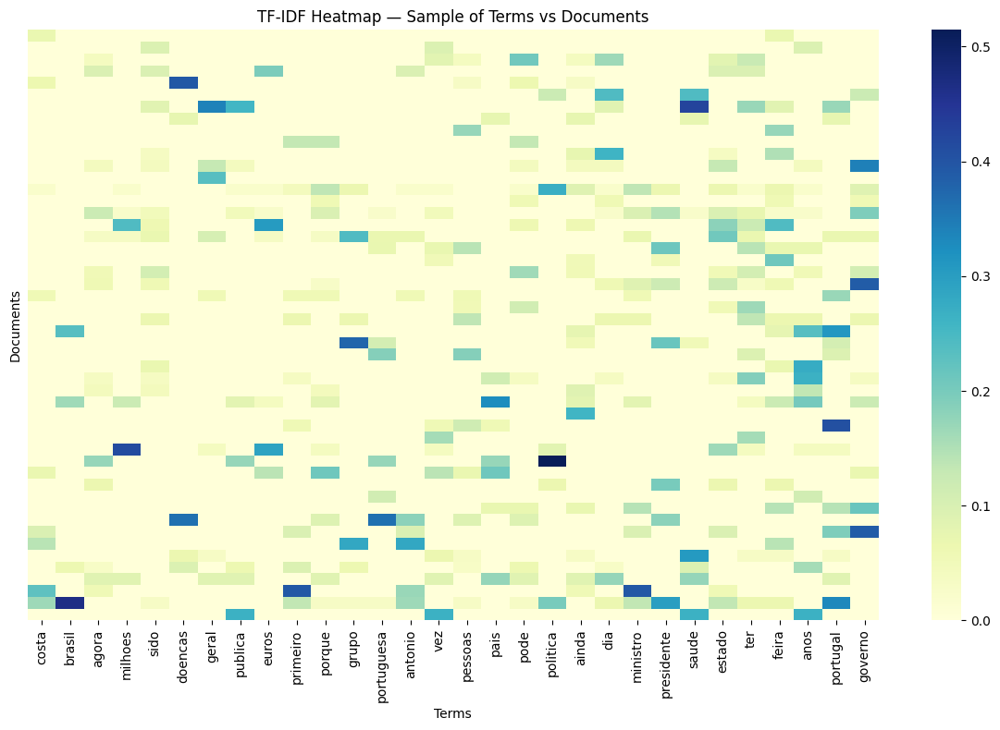

In [ ]:
# Take a small sample for visualization
num_samples = 50
X_sample = X_train[:num_samples].toarray()  # dense for heatmap
terms = np.array(tfidf.get_feature_names_out())

# Pick top 30 terms by average TF-IDF for better visualization
top_term_indices = np.argsort(X_sample.mean(axis=0))[-30:]
X_sample_top = X_sample[:, top_term_indices]
terms_top = terms[top_term_indices]

plt.figure(figsize=(12, 8))
sns.heatmap(X_sample_top, cmap="YlGnBu", yticklabels=False, xticklabels=terms_top)
plt.title("TF-IDF Heatmap — Sample of Terms vs Documents")
plt.xlabel("Terms")
plt.ylabel("Documents")
plt.tight_layout()
plt.savefig("../report/assets/visualizations/tfidf_heatmap.png")
plt.show()
